In [ ]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

red_slice = np.s_[:,:,0]
green_slice = np.s_[:,:,1]
blue_slice = np.s_[:,:,2]

imgs = {}

imgs["baboon"] = cv.imread("./baboon.png")
imgs["chips"] = cv.imread("./chips.png")
imgs["lena"] = cv.imread("./lena.png")
imgs["rgb"] = cv.imread("./rgb.png")
imgs["rgbcube_kBKG"] = cv.imread("./rgbcube_kBKG.png")
imgs["flowers"] = cv.imread("./flowers.jpg")
imgs["hsv_disk"] = cv.imread("./hsv_disk.png")
imgs["monkey"] = cv.imread("./monkey.jpeg")
imgs["strawberries"] = cv.imread("./strawberries.tif")

for k,v in imgs.items():
  imgs[k] = cv.cvtColor(v, cv.COLOR_BGR2RGB)

test = (imgs["baboon"], "baboon")

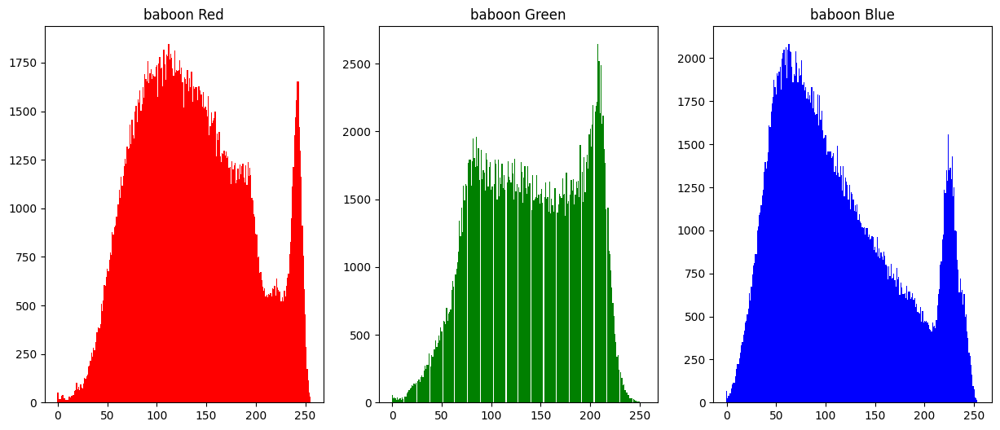

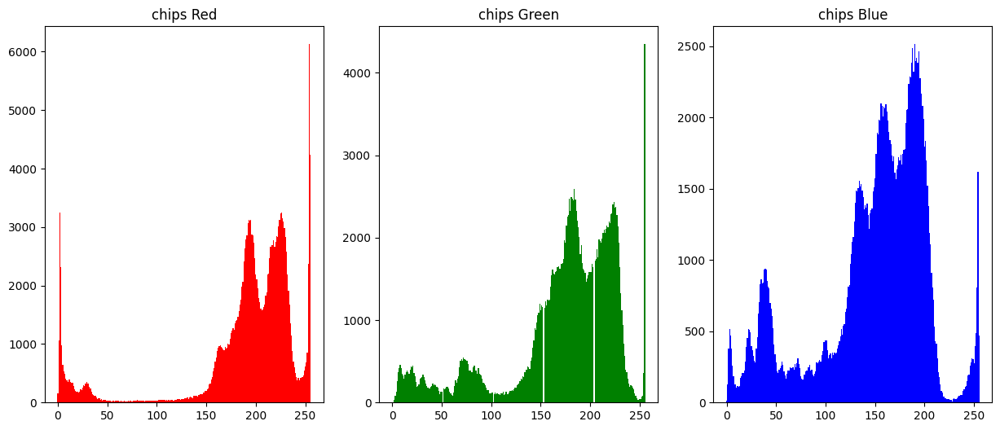

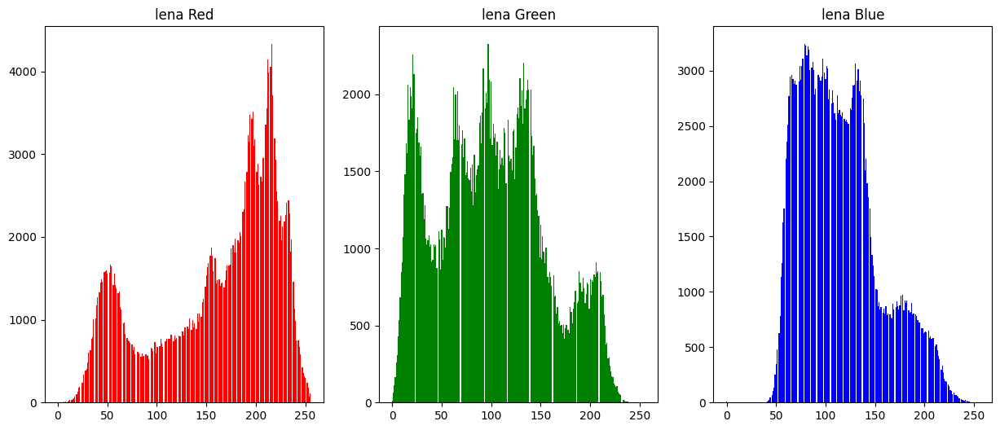

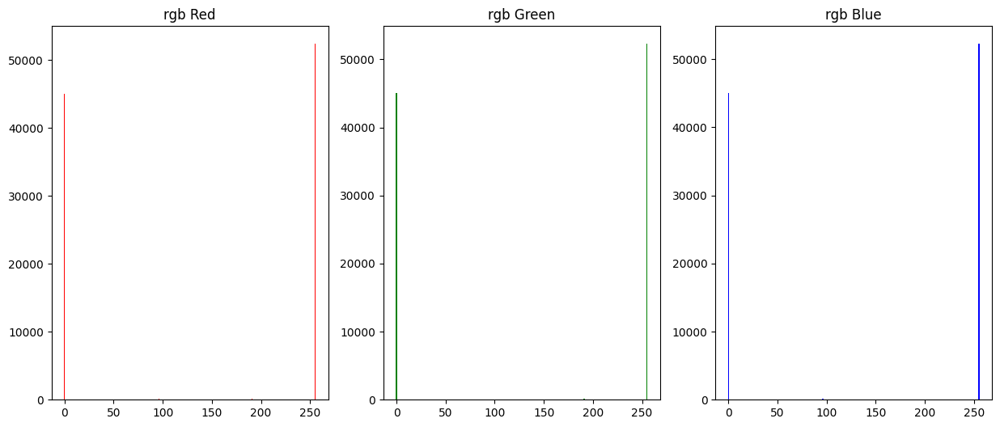

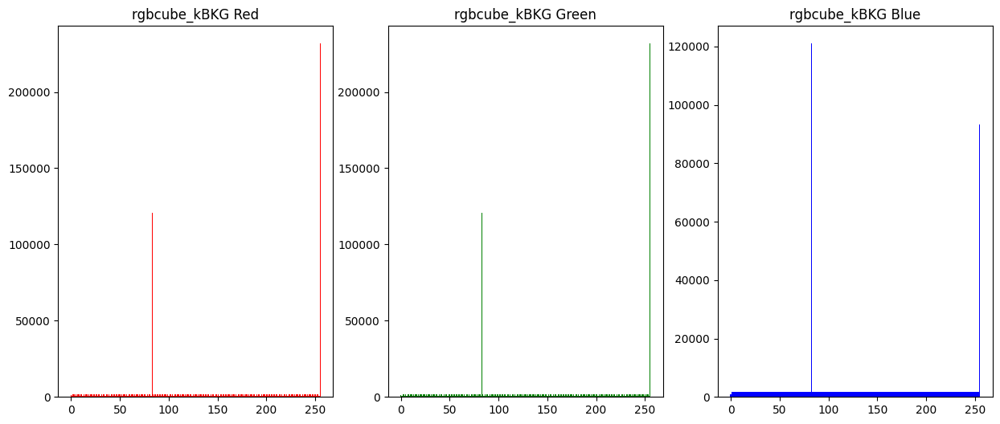

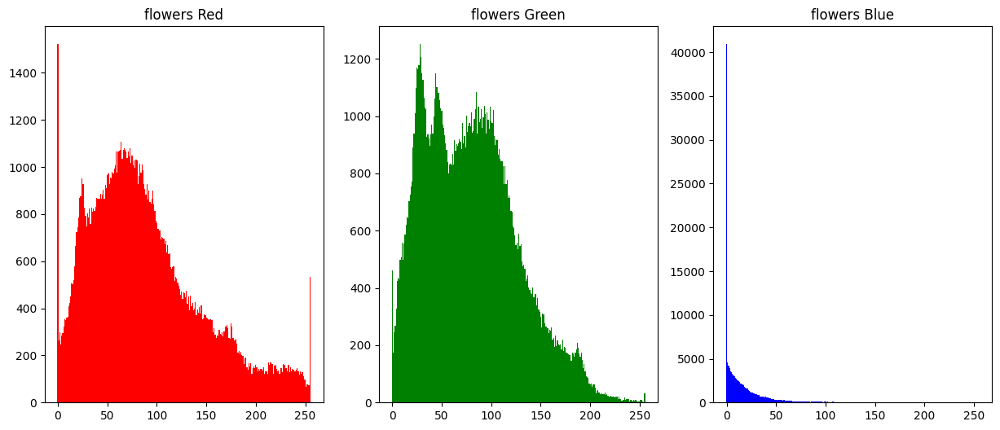

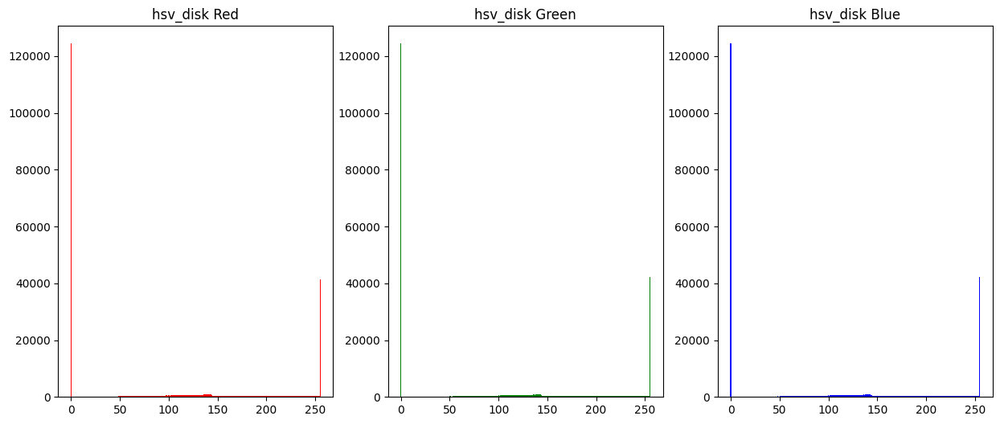

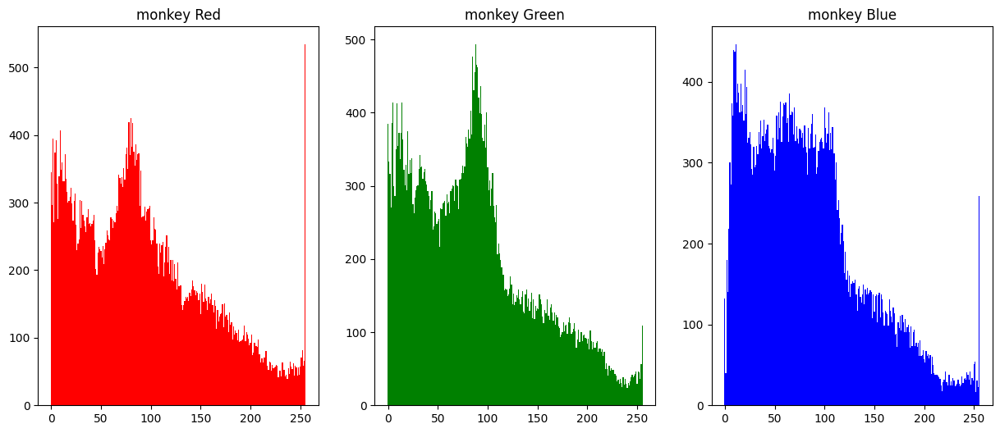

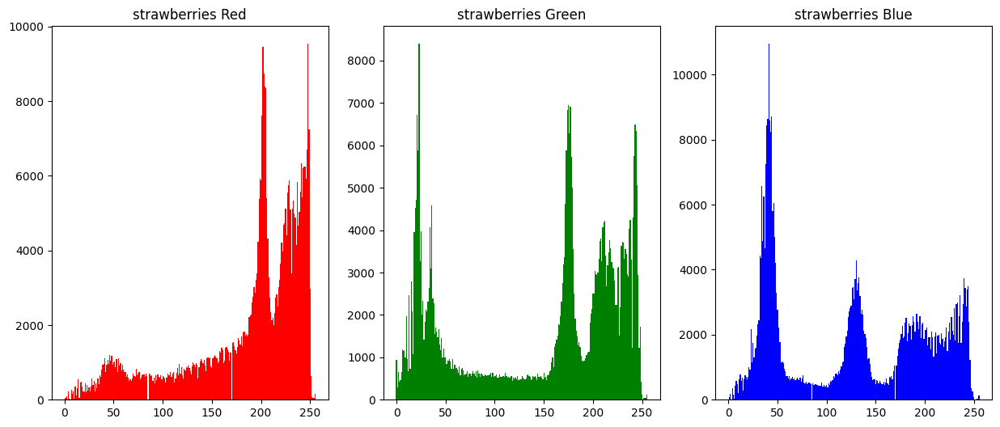

In [ ]:
def display_histograms(img: np.ndarray, im_name: str):
  red_hist, _ = np.histogram(img[red_slice], bins=256)
  green_hist, _ = np.histogram(img[green_slice], bins=256)
  blue_hist, _ = np.histogram(img[blue_slice], bins=256)

  fig, axs = plt.subplots(1,3, figsize=(15,6))

  axs[0].bar(range(0,256), red_hist, width=1, color = "red")
  axs[0].set_title(f'{im_name} Red')

  axs[1].bar(range(0,256), green_hist, width=1, color = "green")
  axs[1].set_title(f'{im_name} Green')

  axs[2].bar(range(0,256), blue_hist, width=1, color = "blue")
  axs[2].set_title(f'{im_name} Blue')

  plt.show()

for k, v in imgs.items():
   display_histograms(v, k)

## 2. Visualize Individual Color Channels

Objective: Extract and display the Red, Green, and Blue channels of a color image as grayscale and pseudo-colored images.

Topics: Channel separation and visualization.

Bonus: Reconstruct the original image using the separated channels.

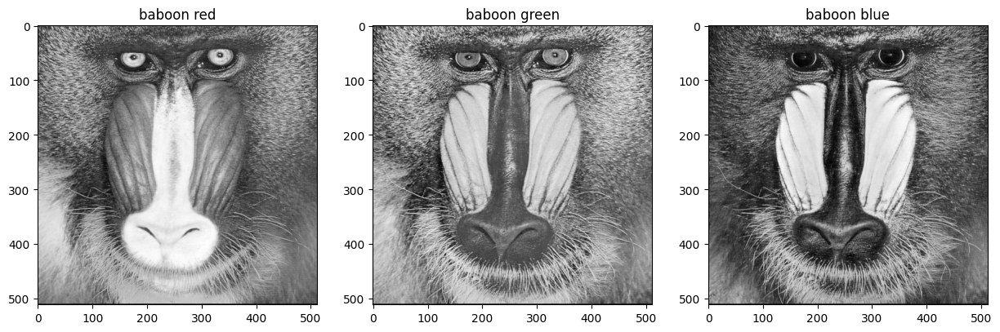

In [ ]:
def visualize_color_channels(img:np.ndarray, im_name: str):
  im_red = img[red_slice]
  im_green = img[green_slice]
  im_blue = img[blue_slice]

  _, a = plt.subplots(1,3, figsize=(15,15))
  a[0].imshow(im_red, cmap='gray')
  a[0].set_title(f"{im_name} red")
  a[1].imshow(im_green, cmap='gray')
  a[1].set_title(f"{im_name} green")
  a[2].imshow(im_blue, cmap='gray')
  a[2].set_title(f"{im_name} blue")

  plt.show()

for k,v in imgs.items():
  visualize_color_channels(v, k)


# 3. Convert Between Color Spaces (RGB ↔ HSV, LAB, YCrCb, CMYK)

Objective: Convert an RGB image to other color spaces and display the result.

Topics: Color space conversion.

Challenge: Display individual channels from each converted space.


# 4. Compare Effects of Blurring in RGB vs HSV

Objective: Apply Gaussian blur in both RGB and HSV color spaces and compare results.

Topics: Color space effect on filtering.

Discussion: Why HSV might preserve color better in some operations.

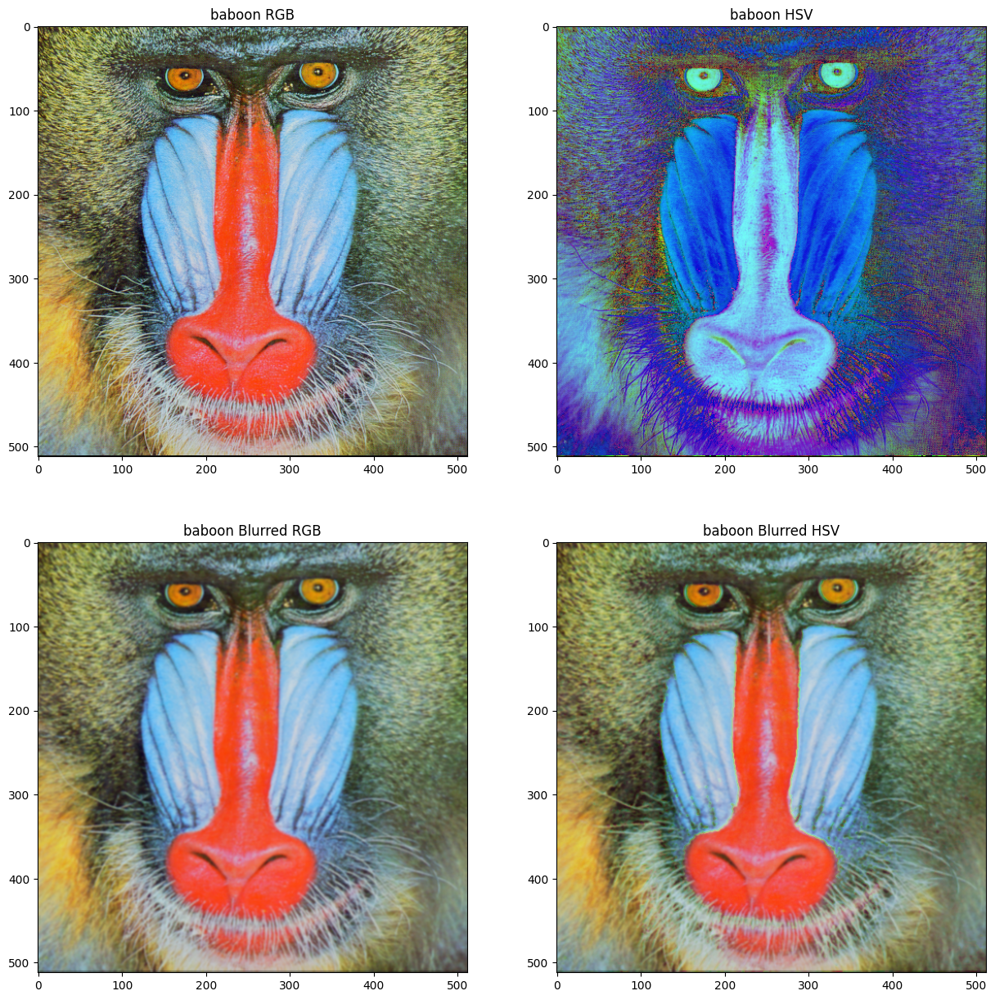

In [ ]:
def compare_rgb_hsv_gblur(img: np.ndarray, im_name: str):
  hsv_img = cv.cvtColor(img, cv.COLOR_BGR2HSV)

  blurred_rgb = cv.GaussianBlur(img, (5,5), 0)
  blurred_hsv = cv.GaussianBlur(hsv_img, (5,5), 0)
  blurred_hsv = cv.cvtColor(blurred_hsv, cv.COLOR_HSV2BGR)

  _, a = plt.subplots(2,2, figsize=(15,15))

  a[0,0].imshow(img)
  a[0,0].set_title(f"{im_name} RGB")

  a[0,1].imshow(hsv_img, cmap="hsv")
  a[0,1].set_title(f"{im_name} HSV")

  a[1,0].imshow(blurred_rgb)
  a[1,0].set_title(f"{im_name} Blurred RGB")

  a[1,1].imshow(blurred_hsv)
  a[1,1].set_title(f"{im_name} Blurred HSV")

  plt.show()


for k,v in imgs.items():
  compare_rgb_hsv_gblur(v, k)


# 5. Apply Edge Detection Filters (Sobel, Laplacian) on Color Images

Objective: Apply Sobel and Laplacian filters on individual channels and on the grayscale version of the image.

Topics: Edge detection, spatial filtering.

Bonus: Merge edge maps from all channels to form a combined result.

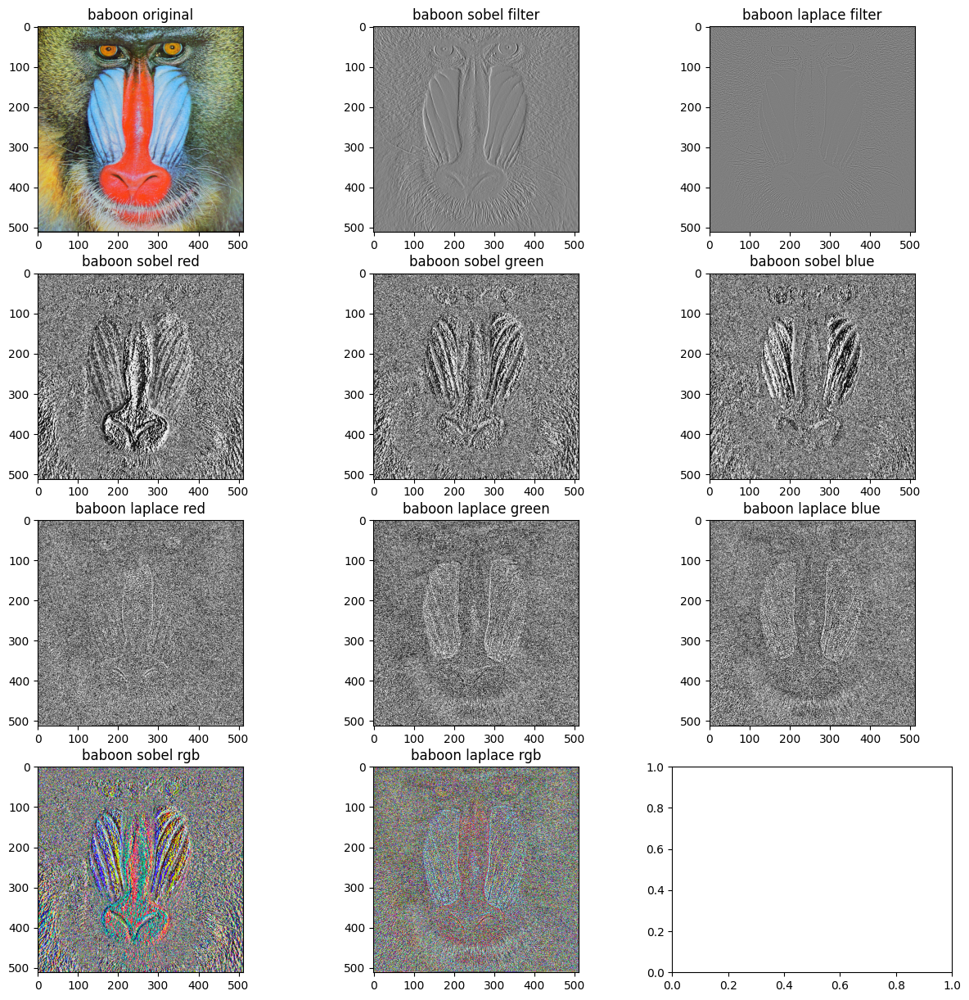

In [ ]:
def edge_detection_filters(img: np.ndarray, im_name: str):
  ddepth = cv.CV_16S
  gray_img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

  red = img[red_slice]
  green = img[green_slice]
  blue = img[blue_slice]

  sobel_img = np.zeros(shape=img.shape, dtype = img.dtype)
  lap_img = np.zeros(shape=img.shape, dtype = img.dtype)

  sobel_img[red_slice] = cv.Sobel(red, ddepth, 1, 0, ksize=3, scale=1,
      delta=0,
      borderType=cv.BORDER_DEFAULT,
  )

  sobel_img[green_slice] = cv.Sobel(green, ddepth, 1, 0, ksize=3, scale=1,
      delta=0,
      borderType=cv.BORDER_DEFAULT,
  )

  sobel_img[blue_slice] = cv.Sobel(blue, ddepth, 1, 0, ksize=3, scale=1,
      delta=0,
      borderType=cv.BORDER_DEFAULT,
  )

  sobel_gray = cv.Sobel(gray_img, ddepth, 1, 0, ksize=3, scale=1,
      delta=0,
      borderType=cv.BORDER_DEFAULT,
  )

  lap_img[red_slice] = cv.Laplacian(red, ddepth)
  lap_img[green_slice] = cv.Laplacian(green, ddepth)
  lap_img[blue_slice] = cv.Laplacian(blue, ddepth)

  lap_gray = cv.Laplacian(gray_img, ddepth)

  fig, a = plt.subplots(4,3, figsize=(15,15))


  a[0,0].imshow(img)
  a[0,0].set_title(f"{im_name} original")

  a[0,1].imshow(sobel_gray, cmap='gray')
  a[0,1].set_title(f"{im_name} sobel filter")

  a[0,2].imshow(lap_gray, cmap='gray')
  a[0,2].set_title(f"{im_name} laplace filter")


  a[1,0].imshow(sobel_img[red_slice], cmap='gray')
  a[1,0].set_title(f"{im_name} sobel red")

  a[1,1].imshow(sobel_img[green_slice], cmap='gray')
  a[1,1].set_title(f"{im_name} sobel green")

  a[1,2].imshow(sobel_img[blue_slice], cmap='gray')
  a[1,2].set_title(f"{im_name} sobel blue")


  a[2,0].imshow(lap_img[red_slice], cmap='gray')
  a[2,0].set_title(f"{im_name} laplace red")

  a[2,1].imshow(lap_img[blue_slice], cmap='gray')
  a[2,1].set_title(f"{im_name} laplace green")

  a[2,2].imshow(lap_img[green_slice], cmap='gray')
  a[2,2].set_title(f"{im_name} laplace blue")

  a[3,0].imshow(sobel_img)
  a[3,0].set_title(f"{im_name} sobel rgb")

  a[3,1].imshow(lap_img)
  a[3,1].set_title(f"{im_name} laplace rgb")

  plt.show

for k,v in imgs.items():
  edge_detection_filters(v, k)



# 6. High-pass and Low-pass Filtering in the Frequency Domain

Objective: Perform DFT on each channel of a color image, apply high-pass and low-pass masks, then reconstruct the image.

Topics: Frequency domain filtering, Fourier Transform.

Tools: cv2.dft(), cv2.idft(), numpy.fft.

# 10. Color Image Enhancement with Histogram Equalization

Objective: Apply histogram equalization on individual channels in different color spaces (e.g., Y in YCrCb, L in LAB).

Topics: Contrast enhancement, color models.

Discussion: Explain why histogram equalization should not be directly applied to RGB.

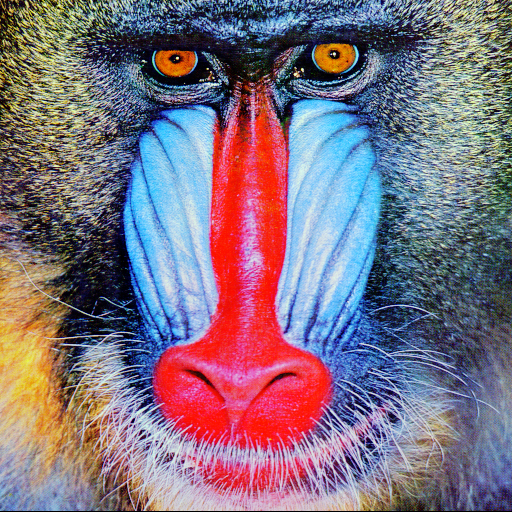

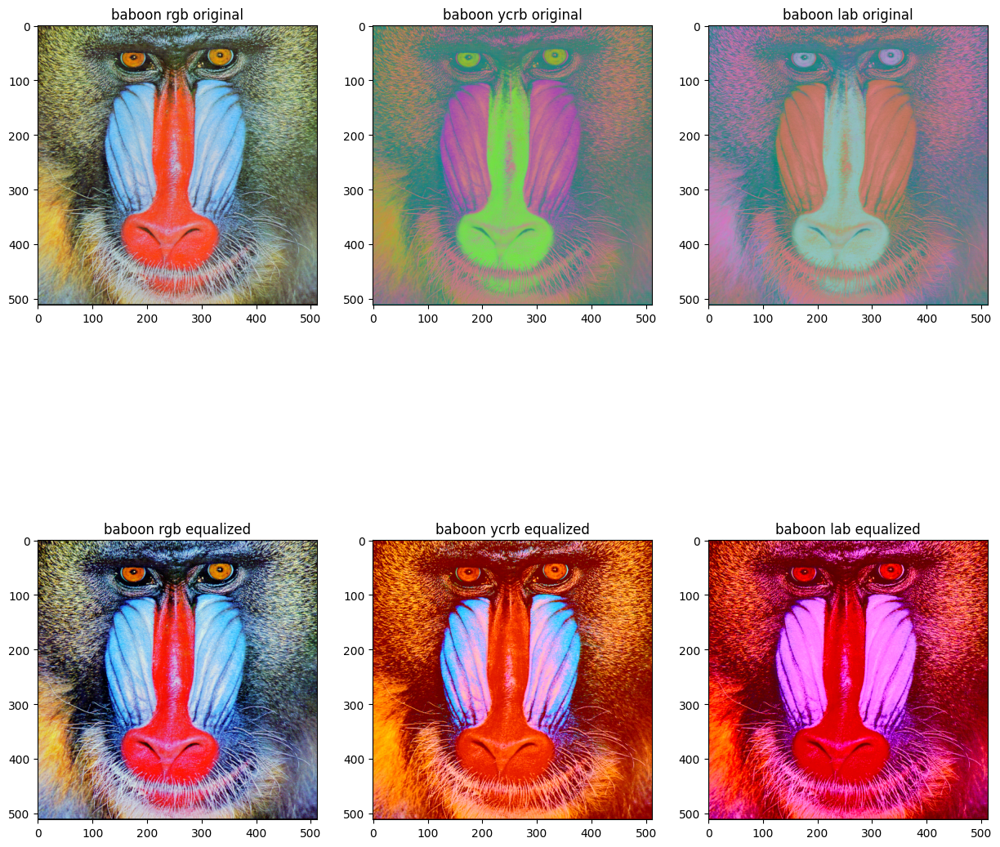

In [ ]:
from typing import Callable

def create_equalizing_function(img: np.ndarray) -> Callable:
  hist, _ = np.histogram(img.ravel(), bins=256)
  mapping = np.zeros(shape=256, dtype=np.uint8)

  for i, v  in enumerate(mapping):
    mapping[i] = int(hist.cumsum()[i] / img.size * 255)

  def equalizer(r: int):
    return mapping[r]

  return equalizer


def histogram_equalization(img: np.ndarray) -> np.ndarray:
  eq_img = np.zeros(shape=img.shape, dtype=img.dtype)

  for channel in range(0, img.shape[2]):
    curr_channel = img[:, :, channel]
    channel_equalizer = create_equalizing_function(curr_channel)

    t = np.zeros(shape=img.shape[0:2], dtype=img.dtype)
    for i, v in np.ndenumerate(curr_channel):
       t[i] = channel_equalizer(v)
    eq_img[:,:, channel] = t

  return eq_img

def apply_histogram_equalization(img:np.ndarray, im_name:str):
  ycrb_img = cv.cvtColor(img, cv.COLOR_RGB2YCR_CB)
  lab_img = cv.cvtColor(img, cv.COLOR_RGB2LAB)

  eq_img = histogram_equalization(img)
  eq_ycrb = histogram_equalization(ycrb_img)
  eq_lab = histogram_equalization(lab_img)

  imshow(cv.cvtColor(eq_img, cv.COLOR_RGB2BGR))

  _, a = plt.subplots(2,3, figsize=(15,15))
  a[0,0].imshow(img)
  a[0,0].set_title(f"{im_name} rgb original")

  a[0,1].imshow(ycrb_img)
  a[0,1].set_title(f"{im_name} ycrb original")

  a[0,2].imshow(lab_img)
  a[0,2].set_title(f"{im_name} lab original")

  a[1,0].imshow(eq_img)
  a[1,0].set_title(f"{im_name} rgb equalized")

  a[1,1].imshow(cv.cvtColor(eq_ycrb, cv.COLOR_YCR_CB2RGB))
  a[1,1].set_title(f"{im_name} ycrb equalized")

  a[1,2].imshow(cv.cvtColor(eq_lab, cv.COLOR_LAB2RGB))
  a[1,2].set_title(f"{im_name} lab equalized")

  plt.show()

apply_histogram_equalization(*test)
